# Image Denoising

In [83]:
from scipy import fftpack
import pandas as pd
from scipy.fft import fft2, ifft2
import numpy as np
import cv2
import glob
import os
%matplotlib inline
import matplotlib.pyplot as plt
import pywt
from skimage.filters import rank
from skimage.restoration import denoise_wavelet
from skimage import color, filters, restoration, util
from skimage.color import gray2rgb, rgb2gray
from skimage.util import img_as_ubyte
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error, structural_similarity

## Pre-Processing

Before applying the denoising algorithm, the input images undergo a preprocessing step to enhance their quality and facilitate better denoising results. The images are read from the folder and are later clipped and turned greyscale.

In [84]:
# Read images from a folder
def read_images(folder_path):
    images = []
    file_pattern = os.path.join(folder_path, "*.png")
    for image_path in glob.glob(file_pattern):
        image = cv2.imread(image_path)
        images.append(image)
    return images


## Fourier Transform

The Fourier Transform is utilised to denoise the images in the frequency domain. This involves transforming the image data from spatial representation to frequency representation, performing denoising operations, and then converting it back to spatial representation.

In [85]:
# Function to remove noise from image using FFT
def denoise_image(noisy, radius=30):
    # Get the dimensions of the image
    rows, columns, channels = noisy.shape
    
    # Initialize an empty array for the denoised image
    denoised = np.zeros_like(noisy)
    
    # Loop through each channel and denoise separately
    for channel in range(channels):
        channel_noisy = noisy[:, :, channel]
        
        # Computes the 2-dimensional discrete Fourier Transform
        fourier = fftpack.fftn(channel_noisy)
        fourier_magnitude = np.abs(fourier) 
    
        # Shifts zero-frequency component to the center 
        fourier_magnitude = fftpack.fftshift(fourier_magnitude)
    
        # Set the center of the spectrum to zero
        fourier_magnitude[rows // 2 - radius: rows // 2 + radius, columns // 2 - radius: columns // 2 + radius] = 0 
    
        # Find all peaks lower than the 98th percentile
        peaks = fourier_magnitude < np.percentile(fourier_magnitude, 99) 

        # Shift the peaks back
        peaks = fftpack.ifftshift(peaks) 
    
        # Make a copy of the spectrum
        fourier_dim = fourier.copy() 

        # Set those peak coefficients to zero
        fourier_dim = fourier_dim * peaks.astype(int) 
        
        # Inverse Fourier transform (reconstruct the image)
        denoised_channel = np.real(fftpack.ifft2(fourier_dim))
        
        # Assign the denoised channel to the corresponding channel in the output
        denoised[:, :, channel] = denoised_channel

    return denoised

# Reference: Bharati, A. (2023). Image-Denoising-using-Fast-Fourier-Transform. 

## Post-Processing

After the denoising algorithm is applied, post-processing steps are performed to further enhance the denoised images and ensure they meet specific criteria. This includes clipping.

In [86]:
# Function to denoise images
def process_images(original_folder, noisy_folder, radius=30):
    
    original_images = read_images(original_folder)
    noisy_images = read_images(noisy_folder)
    
    denoised_images = []
    mse_values = []
    ssim_values = []
    
    # Loop through the images
    for i, (original, noisy) in enumerate(zip(original_images, noisy_images)):
        
        # Check if images have the same dimensions
        if original.shape != noisy.shape:
            raise ValueError("Input images must have the same dimensions.")
        
        # Apply denoising algorithm
        denoised = denoise_image(noisy, radius)
        
        # Post Processing
        denoised = denoised - np.min(denoised)
        denoised = denoised / np.max(denoised) 
        
        # Clipping
        denoised = np.clip(denoised, 0, 1) 
        
        # Calculate Mean Squared Error (MSE)
        mse = mean_squared_error(original, denoised)

        # Calculate Structural SIMilarity (SSIM) index for multichannel images
        ssim_index, _ = structural_similarity(original, denoised, win_size=7, full=True, data_range=original.max() - original.min(), channel_axis=-1)
        
        # Append results to lists
        denoised_images.append(denoised)
        mse_values.append(mse)
        ssim_values.append(ssim_index)

    # Create a DataFrame
    results = pd.DataFrame({
        'Denoised Image': denoised_images,
        'MSE': mse_values,
        'SSIM': ssim_values
    })

    return results

## Output

The images in the 3 given files are processed and a dataframe for each is created.

In [87]:
# Specify folders
original_folder = "Task-A-Dataset-denoising/original"
noisy50_folder = "Task-A-Dataset-denoising/noisy50"
noisy25_folder = "Task-A-Dataset-denoising/noisy25"
noisy10_folder = "Task-A-Dataset-denoising/noisy10"

# Process images
denoised50 = process_images(original_folder, noisy50_folder)
denoised25 = process_images(original_folder, noisy25_folder)
denoised10 = process_images(original_folder, noisy10_folder)


## Other Methods

Three further image denoising techniques are demonstrated: Mean Denoising, Median Denoising, and Wavelet Denoising. Fourier Transform removes noise by transforming the image into the frequency domain. Mean Denoising calculates local mean pixel intensity, while Median Denoising uses local medians for noise reduction. Wavelet Denoising applies the VisuShrink thresholding technique. Visual outputs of the denoised images are presented, offering a concise comparison of these diverse denoising approaches on a common noisy input image.

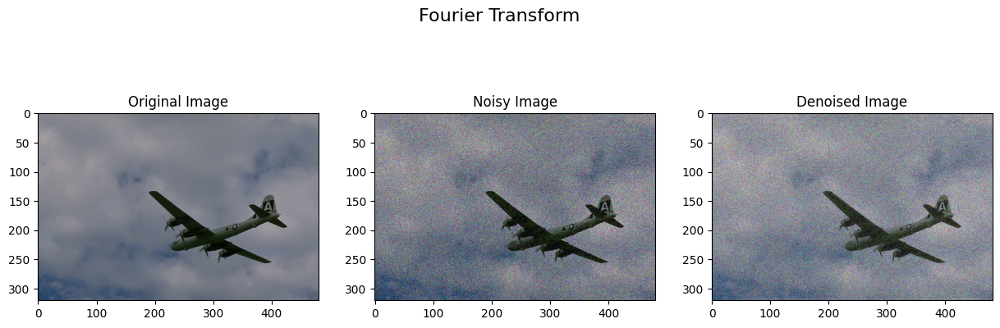

C:\Users\ajmas\AppData\Local\Temp\ipykernel_7340\515196730.py:2: UserWarning: Possible precision loss converting image of type float32 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  denoised_channels = [rank.mean(channel, np.ones((3, 3))) for channel in image.transpose(2, 0, 1)]


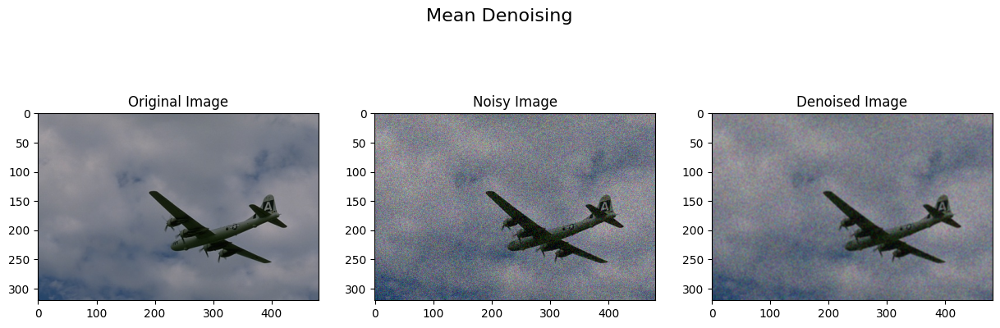

C:\Users\ajmas\AppData\Local\Temp\ipykernel_7340\515196730.py:6: UserWarning: Possible precision loss converting image of type float32 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  denoised_channels = [rank.median(channel, np.ones((3, 3))) for channel in image.transpose(2, 0, 1)]


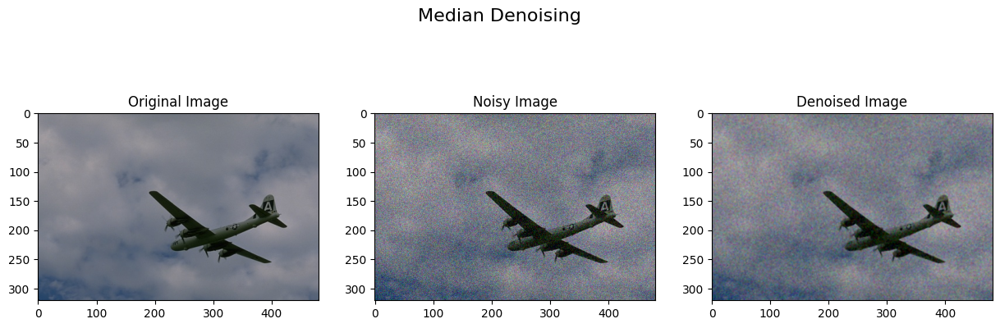

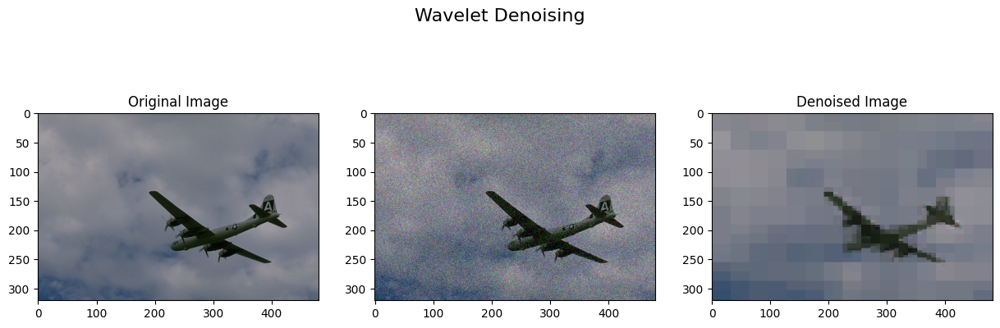

In [88]:
def mean_denoise(image):
    denoised_channels = [rank.mean(channel, np.ones((3, 3))) for channel in image.transpose(2, 0, 1)]
    return img_as_ubyte(np.stack(denoised_channels, axis=-1))

def median_denoise(image):
    denoised_channels = [rank.median(channel, np.ones((3, 3))) for channel in image.transpose(2, 0, 1)]
    return img_as_ubyte(np.stack(denoised_channels, axis=-1))

def wavelet_denoise(image):
    denoised_channels = [denoise_wavelet(channel, method='VisuShrink') for channel in image.transpose(2, 0, 1)]
    return img_as_ubyte(np.stack(denoised_channels, axis=-1))


# Create subplots
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

# Display original image
ax1.imshow(plt.imread(os.path.join(original_folder, '0000.png')))
ax1.set_title('Original Image')

# Display noisy image
ax2.imshow(plt.imread(os.path.join(noisy25_folder, '0000.png')))
ax2.set_title('Noisy Image')

img = denoise_image(plt.imread(os.path.join(noisy25_folder, '0000.png')))

# Post Processing
img = img - np.min(img)
img = img / np.max(img) 

# Clipping
denoised = np.clip(img, 0, 1) 
              
# Display denoised image
ax3.imshow(img)
ax3.set_title('Denoised Image')

# Add a common title for the entire figure
f.suptitle('Fourier Transform', fontsize=16)

plt.show()


# Create subplots
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

# Display original image
ax1.imshow(plt.imread(os.path.join(original_folder, '0000.png')))
ax1.set_title('Original Image')

# Display noisy image
ax2.imshow(plt.imread(os.path.join(noisy25_folder, '0000.png')))
ax2.set_title('Noisy Image')

# Display denoised image
ax3.imshow(mean_denoise(plt.imread(os.path.join(noisy25_folder, '0000.png'))))
ax3.set_title('Denoised Image')

# Add a common title for the entire figure
f.suptitle('Mean Denoising', fontsize=16)

plt.show()


# Create subplots
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

# Display original image
ax1.imshow(plt.imread(os.path.join(original_folder, '0000.png')))
ax1.set_title('Original Image')

# Display noisy image
ax2.imshow(plt.imread(os.path.join(noisy25_folder, '0000.png')))
ax2.set_title('Noisy Image')

# Display denoised image
ax3.imshow(median_denoise(plt.imread(os.path.join(noisy25_folder, '0000.png'))))
ax3.set_title('Denoised Image')

# Add a common title for the entire figure
f.suptitle('Median Denoising', fontsize=16)

plt.show()

# Create subplots
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

# Display original image
ax1.imshow(plt.imread(os.path.join(original_folder, '0000.png')))
ax1.set_title('Original Image')

# Display noisy image
ax2.imshow(plt.imread(os.path.join(noisy25_folder, '0000.png')))
ax3.set_title('Noisy Image')

# Display denoised image
ax3.imshow(wavelet_denoise(plt.imread(os.path.join(noisy25_folder, '0000.png'))))
ax3.set_title('Denoised Image')

# Add a common title for the entire figure
f.suptitle('Wavelet Denoising', fontsize=16)

plt.show()

## Results

Generating 25 results of denoising

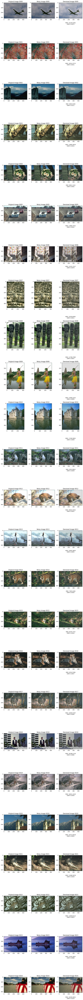

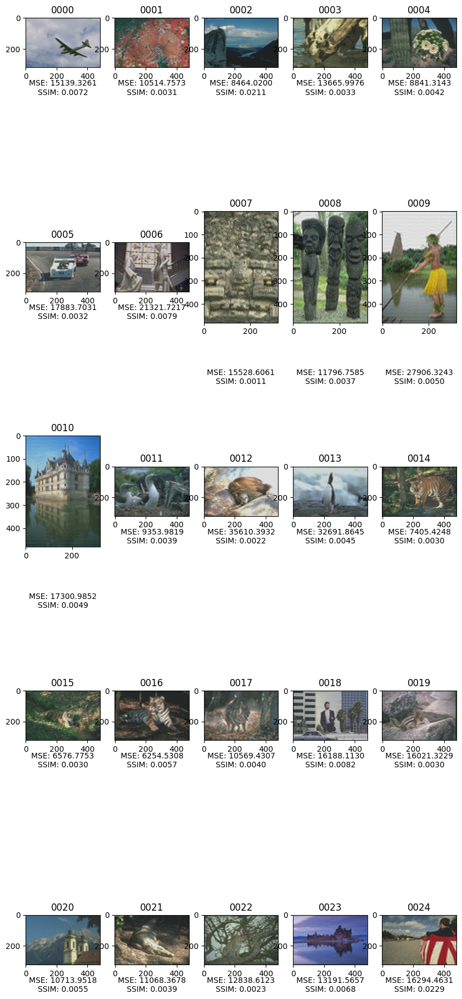

In [89]:
# Number of rows and columns for the subplot grid
num_rows = 25
num_cols = 3

# Create a figure and axis array
f, axs = plt.subplots(num_rows, num_cols, figsize=(10, 5 * num_rows))

# Loop through the folders and plot images
for i in range(num_rows):
    
    # Read the images
    original_img = plt.imread(os.path.join(original_folder, f'{i:04d}.png'))
    noisy_img = plt.imread(os.path.join(noisy10_folder, f'{i:04d}.png'))
    
    # Denoise the noisy image
    denoised_img = denoise_image(noisy_img)
    
    # Post Processing
    denoised_img = denoised_img - np.min(denoised_img)
    denoised_img = denoised_img / np.max(denoised_img) 
    
    # Clipping
    denoised_img = np.clip(denoised_img, 0, 1) 

    # Display original image
    axs[i, 0].imshow(original_img)
    axs[i, 0].set_title(f'Original Image {i:04d}')

    # Display noisy image
    axs[i, 1].imshow(noisy_img)
    axs[i, 1].set_title(f'Noisy Image {i:04d}')

    # Display denoised image
    axs[i, 2].imshow(denoised_img)
    axs[i, 2].set_title(f'Denoised Image {i:04d}')
    
    # Print MSE and SSIM values below denoised image
    mse_value = denoised10['MSE'][i]
    ssim_value = denoised10['SSIM'][i]
    axs[i, 2].text(0.5, -0.4, f'MSE: {mse_value:.4f}\nSSIM: {ssim_value:.4f}', size=10, ha='center', transform=axs[i, 2].transAxes)

plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the chart as an image file
plt.savefig('comparison_chart.png', bbox_inches='tight')

plt.show()


# Number of rows and columns for the subplot grid
num_rows = 5
num_cols = 5

# Create a figure and axis array
f, axs = plt.subplots(num_rows, num_cols, figsize=(10, 5 * num_rows), gridspec_kw={'hspace': 0.3})

# Loop through the folders and plot denoised images
for i in range(num_rows * num_cols):
    
    noisy_img = plt.imread(os.path.join(noisy10_folder, f'{i:04d}.png'))
    
    # Denoise the noisy image
    denoised_img = denoise_image(noisy_img)
    
    # Post Processing
    denoised_img = denoised_img - np.min(denoised_img)
    denoised_img = denoised_img / np.max(denoised_img) 
    
    # Clipping
    denoised_img = np.clip(denoised_img, 0, 1) 

    # Display denoised image
    axs[i // num_cols, i % num_cols].imshow(denoised_img)
    axs[i // num_cols, i % num_cols].set_title(f'{i:04d}')
    
    # Print MSE and SSIM values below denoised image
    mse_value = denoised10['MSE'][i]
    ssim_value = denoised10['SSIM'][i]
    axs[i // num_cols, i % num_cols].text(0.5, -0.55, f'MSE: {mse_value:.4f}\nSSIM: {ssim_value:.4f}', size=10, ha='center', transform=axs[i // num_cols, i % num_cols].transAxes)

# Save the chart as an image file
plt.savefig('output_chart.png', bbox_inches='tight')

# This is for the noisy10 folder. The same code can be used for the other noisy folders by changing the folder name in the code.

## References

Bharati, A. (2023). Image-Denoising-using-Fast-Fourier-Transform. 